## LOGISTIC REGRESSION AND DECISION TREES CLASSIFICATION MODELS FOR DATES

### Introduction
A great variety of fruits of diverse sorts are grown all over the world. Color, length, diameter, and shape are external appearance features that distinguish the sort of fruit. The appearance of the fruits is crucial in distinguishing the fruit type. Identifying the type of fruit based on its look requires talent, which is time-consuming and labor-intensive. The purpose of this study is to categorize the numerous types of date fruit, which are Barhee, Deglet Nour, Sukkary, Rotab Mozafati, Ruthana, Safawi, and Sagai, using two machine learning algorithms, Logistic Regression and Decision Trees model. To that end, 898 photographs of seven distinct date fruit kinds were acquired using a computer vision system (CVS). These photos were processed using image processing algorithms to extract 34 attributes, including morphological traits, form, and color.

Previously, models were constructed using the logistic regression (LR) and artificial neural network (ANN) approaches, both of which are machine learning methods. These approaches provide 91.0 percent and 92.2 percent performance outcomes, respectively. The performance result was then raised to 92.8 percent using the stacking model generated by merging these models. It has been determined that machine learning approaches may be successfully used to the categorization of date fruit kinds.

In this study, the logistic regression model will also be fit on the provided dataset, and try to determine if the fit model will perform as well as the one that had been fit in the previous works. The study will go further and fit a decision tree model, and determine if it outperforms the logistic regression model.

There are four steps in any machine learning project, they will also be applied in this paper:
1. Importing data
2. Exploratory Data Analysis
3. Model Fitting and Model Evaluation.

This work was done utilizing Python and jupyter notebooks as tools for analysis.



### 1. Import LIbraries and Data

In [1]:
{
    "tags": [
        "remove-input"
    ]
}
 
 
##LIbraries
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from pandas import read_csv
from pandas import set_option
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
import seaborn as sns



pd.options.display.float_format = '{:,.4f}'.format
import warnings
warnings.filterwarnings('ignore')

The data was in the form of an excel file, therefore pandas' read_excel module was used to import the data from the excel file. The data was loaded as a pandas dataframe.

In [2]:
{
    "tags": [
        "remove-input"
    ]
} 

##import data
df = pd.read_excel("data.xls")


### 2. Exploratory Data Analysis

Exploratory Data Analysis is the crucial process of doing preliminary investigations on data in order to uncover patterns, spot anomalies, test hypotheses, and validate assumptions using summary statistics and graphical representations. It is best to first analyze the data and then strive to get as many insights as possible from it. Before getting their hands dirty with data, EDA is all about making sense of it. You cannot fit a model without first understanding the kind of data you have. By first understanding the data you have for analysis can you determine which model best fits your data, which aspects are to be excluded or thrown away, problems you need to fix and which features to retain and are crucial to fitting an accurate and well performing model.

In [3]:
df.shape

(898, 35)

The first step was to determine the dimensions of the dataset. We determined that the data has 34 features and one response variable. The number of records/rows was 898. The second step was to determine the structure of the dataset, that is the datatypes and names of the features provided.

In [4]:
{
    "tags": [
        "remove-input"
    ]
} 

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 898 entries, 0 to 897
Data columns (total 35 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   AREA           898 non-null    int64  
 1   PERIMETER      898 non-null    float64
 2   MAJOR_AXIS     898 non-null    float64
 3   MINOR_AXIS     898 non-null    float64
 4   ECCENTRICITY   898 non-null    float64
 5   EQDIASQ        898 non-null    float64
 6   SOLIDITY       898 non-null    float64
 7   CONVEX_AREA    898 non-null    int64  
 8   EXTENT         898 non-null    float64
 9   ASPECT_RATIO   898 non-null    float64
 10  ROUNDNESS      898 non-null    float64
 11  COMPACTNESS    898 non-null    float64
 12  SHAPEFACTOR_1  898 non-null    float64
 13  SHAPEFACTOR_2  898 non-null    float64
 14  SHAPEFACTOR_3  898 non-null    float64
 15  SHAPEFACTOR_4  898 non-null    float64
 16  MeanRR         898 non-null    float64
 17  MeanRG         898 non-null    float64
 18  MeanRB    

We note that only the response variable had the object/categorical datatype, the rest were numerical features. Which meant that it was easier to carry out data manipulation on a dataset that had only numerical variables as its features. Dealing with categorical variables during data cleaning and manipulation is sometimes tedious and if not handled well, the manipulated data could lead to misleading analysis and reporting.

### Univariate Analysis

So, what exactly is univariate analysis? Univariate analysis is the most fundamental type of statistical data analysis approach. The data in this case only has one variable and does not have to deal with a cause-and-effect connection. Consider a classroom survey, for example. The analysts would want to count how many males and girls are in the room. The data presented here only discusses the number, which is a single variable, and the variable quantity. The primary goal of univariate analysis is to characterize the data in order to discover patterns in the data. This is accomplished by examining the mean, mode, median, standard deviation, dispersion, and so on.

Univariate analysis is the most fundamental type of data analysis. Uni means one, and thus indicates that the data contains only one type of variable. The primary objective for doing univariate analysis is to characterize the data. The analysis will gather data, summarize it, and then look for patterns.
In univariate analysis, a variable is just a condition or subset of your data. It can be considered a "category." It does not, evaluate more than one variable at a time, nor does it consider their connection with other variables.

#### Summary Statistics

The next step was to obtain numerical summary of the numerical features. The  aspects that were paid attention to were the mean and standard deviation. It was noted that some features displayed little no variance, indicating that they did not vary much in all the date classes. Which means that they would not be of much impact on the model.

In [5]:
{
    "tags": [
        "remove-input"
    ]
} 

df.describe()

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,EQDIASQ,SOLIDITY,CONVEX_AREA,EXTENT,ASPECT_RATIO,...,SkewRB,KurtosisRR,KurtosisRG,KurtosisRB,EntropyRR,EntropyRG,EntropyRB,ALLdaub4RR,ALLdaub4RG,ALLdaub4RB
count,898.0000,898.0000,898.0000,898.0000,898.0000,898.0000,898.0000,898.0000,898.0000,898.0000,...,898.0000,898.0000,898.0000,898.0000,898.0000,898.0000,898.0000,898.0000,898.0000,898.0000
mean,"298,295.2071","2,057.6610",750.8120,495.8728,0.7375,604.5779,0.9818,"303,845.5924",0.7363,2.1311,...,0.2505,4.2478,5.1109,3.7809,"-31,850,205,774.0935","-29,018,599,755.4744","-27,718,762,813.8619",50.0829,48.8057,48.0984
std,"107,245.2053",410.0125,144.0593,114.2689,0.0887,119.5939,0.0182,"108,815.6569",0.0537,17.8208,...,0.6329,2.8924,3.7455,2.0498,"20,372,409,863.6670","17,129,522,646.0455","14,841,374,790.1303",16.0631,14.1259,10.8139
min,"1,987.0000",911.8280,336.7227,2.2832,0.3448,50.2984,0.8366,"2,257.0000",0.5123,1.0653,...,-1.0291,1.7082,1.6076,1.7672,"-109,122,000,000.0000","-92,616,974,336.0000","-87,471,767,552.0000",15.1911,20.5247,22.1300
25%,"206,948.0000","1,726.0915",641.0686,404.6844,0.6856,513.3171,0.9788,"210,022.7500",0.7059,1.3737,...,-0.1969,2.5366,2.5088,2.5773,"-44,294,441,984.0000","-38,946,376,704.0000","-35,645,342,720.0000",38.2244,38.6545,39.2507
50%,"319,833.0000","2,196.3454",791.3634,495.0548,0.7547,638.1409,0.9873,"327,207.0000",0.7470,1.5242,...,0.1356,3.0698,3.1278,3.0807,"-28,261,560,320.0000","-26,209,897,472.0000","-23,929,284,608.0000",53.8413,50.3378,49.6141
75%,"382,573.0000","2,389.7166",858.6338,589.0317,0.8022,697.9305,0.9918,"388,804.0000",0.7759,1.6747,...,0.5939,4.4498,7.3204,4.2831,"-14,604,819,712.0000","-14,331,047,936.0000","-16,603,665,152.0000",63.0633,59.5736,56.6667
max,"546,063.0000","2,811.9971","1,222.7230",766.4536,1.0000,833.8279,0.9974,"552,598.0000",0.8562,535.5257,...,3.0923,26.1711,26.7367,32.2495,"-162,731,632.0000","-562,772,672.0000","-437,043,456.0000",79.8289,83.0649,74.1046


#### Distribution of Predictors

In this step, a plot showing histrograms was created. Histograms are a quick method to obtain an overview of how each feature is distributed. Histograms divide data into bins and count the number of observations in each bin. The shape of the bins may instantly tell you whether a feature has a Gaussian, skewed, or even exponential distribution. It can also assist you in identifying potential outliers.

It is important to note that all the entropy related features and also features such as solidity, roundness, and compactness were skewed to the right. The rest of the features, displayed an almost Gaussian distribution, that is, because the graph of its probability density looks like a bell.While the rest were skewed to the right. 
From the plot we could also identify that some features had a large amount of outliers. Which lead to the developing a box plot to look outliers in the features.

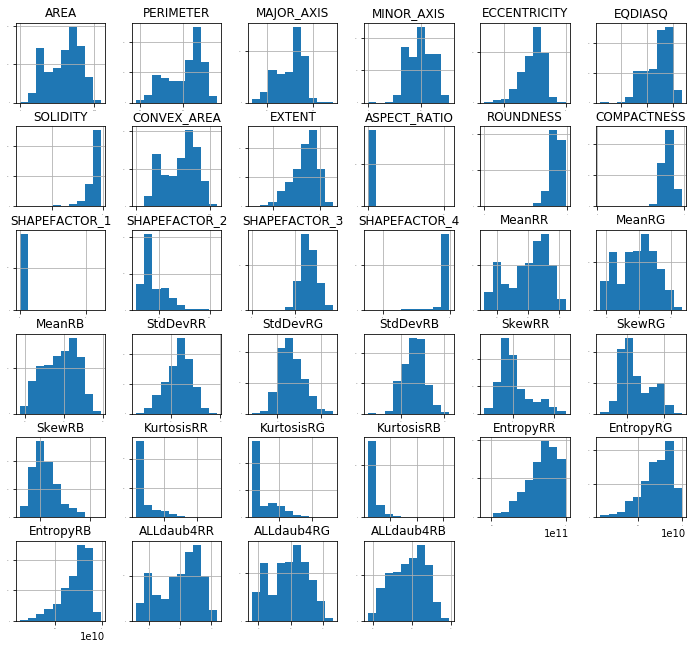

In [6]:
# histograms
# Increase size of plot in jupyter
{
    "tags": [
        "remove-input"
    ]
}
plt.rcParams["figure.figsize"] = (12,11)
df.hist(sharex=False, sharey=False, xlabelsize=1, ylabelsize=1)
plt.show()

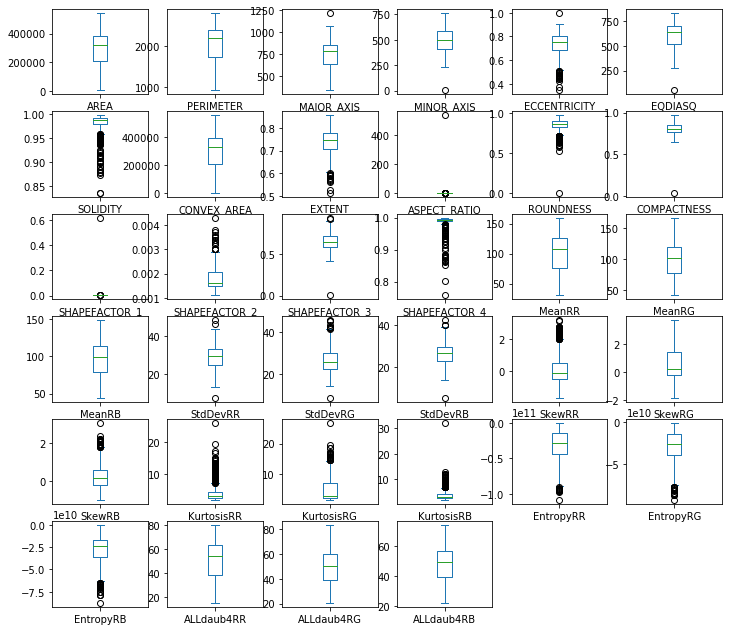

In [7]:
{
    "tags": [
        "remove-input"
    ]
}
# Increase size of plot in jupyter

plt.rcParams["figure.figsize"] = (12,11)
# box and whisker plots
df.plot(kind='box', subplots=True, layout=(6,6), sharex=False, sharey=False)
plt.show()


From the boxplot, some features displayed extremely amounts of outliers. These features included:
Eccentricity, Solidity, Extent, Roundness, Shape Factor2 and Shapefactor 4, SkewRR, and all features of Kurtosis and Entropy

### Bivariate Analysis

A bivariate analysis is one that is used to investigate the connection between two variables. For each observation in this analysis, two measurements were taken. In this instance, the samples might be in pairs or independently with various treatments. In general, the variables employed in a bivariate analysis might be connected or independent (independent). Interconnected indicates that the same sample is subjected to two distinct measurements.
Meanwhile, independent measurements are performed on two distinct sample sets.

#### Correlation Analysis

Correlation analysis is a statistical approach for determining the strength of a link between two numerically measured continuous variables (e.g. height and weight). This form of analysis is beneficial when a researcher wishes to see whether there are any probable relationships between variables. Correlation analysis is sometimes misinterpreted to determine cause and effect; however, this is not the case because other variables not included in the research may have influenced the results.

When there is a correlation between two variables, it indicates that when there is a systematic change in one, there is also a systematic change in the other; the variables change together over time. If a correlation is discovered, it might be positive or negative based on the numerical values measured.Person's correlation coefficient was employed in this study. Pearson's product-moment coefficient measures correlation and varies between +1 and -1 (depending on the correlation). The strongest positive connection is shown by +1, and the strongest negative correlation is indicated by -1. As a result, the closer the coefficient is to one of these figures, the higher the correlation of the data it reflects. Because 0 shows no correlation on this scale, numbers closer to zero suggest weaker/poorer correlation than those closer to +1/-1.

From the correlation matrix below some of features, especially those related to finding area and perimeter had strong correlation of above 0.8 and there were others that showed an almost correlation with each  other 

In [8]:
{
    "tags": [
        "remove-input"
    ]
}

df.corr().style.background_gradient().set_precision(2)

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,EQDIASQ,SOLIDITY,CONVEX_AREA,EXTENT,ASPECT_RATIO,ROUNDNESS,COMPACTNESS,SHAPEFACTOR_1,SHAPEFACTOR_2,SHAPEFACTOR_3,SHAPEFACTOR_4,MeanRR,MeanRG,MeanRB,StdDevRR,StdDevRG,StdDevRB,SkewRR,SkewRG,SkewRB,KurtosisRR,KurtosisRG,KurtosisRB,EntropyRR,EntropyRG,EntropyRB,ALLdaub4RR,ALLdaub4RG,ALLdaub4RB
AREA,1.00,0.96,0.88,0.95,-0.37,0.99,0.03,1.00,-0.09,-0.10,0.04,0.32,-0.12,-0.86,0.33,0.04,-0.35,-0.38,-0.38,-0.32,-0.17,-0.05,0.38,0.40,0.43,0.22,0.33,0.38,-0.36,-0.39,-0.51,-0.35,-0.38,-0.38
PERIMETER,0.96,1.00,0.96,0.86,-0.17,0.96,-0.13,0.96,-0.21,0.02,-0.24,0.08,-0.01,-0.93,0.10,-0.04,-0.45,-0.47,-0.45,-0.39,-0.20,-0.18,0.49,0.48,0.42,0.31,0.40,0.36,-0.27,-0.29,-0.42,-0.45,-0.47,-0.45
MAJOR_AXIS,0.88,0.96,1.00,0.72,0.06,0.89,-0.17,0.89,-0.28,0.11,-0.36,-0.16,0.08,-0.96,-0.14,-0.05,-0.53,-0.54,-0.51,-0.44,-0.25,-0.28,0.55,0.55,0.41,0.37,0.46,0.35,-0.15,-0.17,-0.30,-0.53,-0.54,-0.51
MINOR_AXIS,0.95,0.86,0.72,1.00,-0.61,0.95,0.06,0.95,0.03,-0.15,0.24,0.55,-0.18,-0.74,0.57,-0.00,-0.20,-0.23,-0.25,-0.20,-0.08,0.10,0.23,0.26,0.40,0.09,0.19,0.35,-0.47,-0.50,-0.59,-0.20,-0.23,-0.25
ECCENTRICITY,-0.37,-0.17,0.06,-0.61,1.00,-0.34,-0.22,-0.36,-0.34,0.11,-0.66,-0.92,0.11,-0.03,-0.97,-0.02,-0.25,-0.24,-0.18,-0.14,-0.10,-0.39,0.22,0.18,-0.18,0.22,0.19,-0.18,0.43,0.46,0.44,-0.25,-0.24,-0.18
EQDIASQ,0.99,0.96,0.89,0.95,-0.34,1.00,0.02,0.99,-0.11,-0.16,0.04,0.30,-0.19,-0.89,0.30,0.04,-0.37,-0.41,-0.40,-0.32,-0.16,-0.07,0.39,0.42,0.42,0.23,0.34,0.37,-0.35,-0.38,-0.49,-0.37,-0.41,-0.40
SOLIDITY,0.03,-0.13,-0.17,0.06,-0.22,0.02,1.00,-0.02,0.39,-0.19,0.61,0.38,-0.19,0.05,0.37,0.87,0.08,0.05,0.05,-0.04,-0.12,0.09,-0.19,-0.10,0.03,-0.13,-0.06,0.07,-0.04,-0.04,-0.06,0.08,0.05,0.05
CONVEX_AREA,1.00,0.96,0.89,0.95,-0.36,0.99,-0.02,1.00,-0.11,-0.10,0.02,0.30,-0.12,-0.87,0.31,0.01,-0.36,-0.39,-0.38,-0.32,-0.17,-0.05,0.39,0.41,0.43,0.23,0.33,0.38,-0.36,-0.39,-0.50,-0.36,-0.39,-0.38
EXTENT,-0.09,-0.21,-0.28,0.03,-0.34,-0.11,0.39,-0.11,1.00,0.07,0.47,0.37,0.07,0.22,0.39,0.23,0.35,0.34,0.32,0.21,0.11,0.29,-0.39,-0.34,-0.08,-0.33,-0.32,-0.05,-0.22,-0.21,-0.18,0.35,0.34,0.32
ASPECT_RATIO,-0.10,0.02,0.11,-0.15,0.11,-0.16,-0.19,-0.10,0.07,1.00,-0.41,-0.42,1.00,-0.06,-0.24,-0.13,-0.01,0.08,0.08,-0.12,-0.11,-0.15,0.04,-0.01,0.05,0.04,-0.02,0.06,0.06,0.06,0.07,-0.01,0.08,0.08


From the boxplot, some features displayed extremely amounts of outliers. These features included:
Eccentricity, Solidity, Extent, Roundness, Shape Factor2 and Shapefactor 4, SkewRR, and all features of Kurtosis and Entropy. The pairplot below was used to visualize the results of the correlation matrix above.

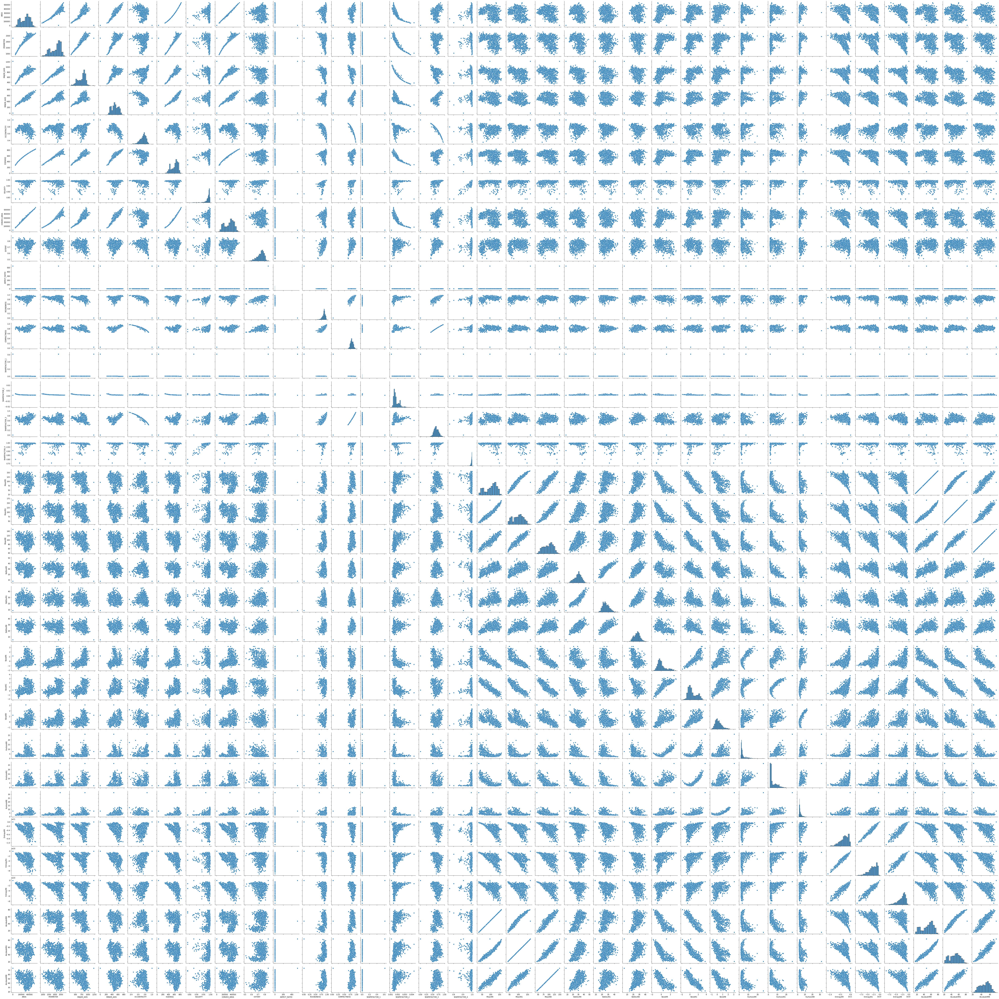

In [9]:
{
    "tags": [
        "remove-input"
    ]
}

sns.pairplot(df)

The classes of the response variables were also looked at as the final step of the exploratory data analysis. The aim was to determine if there was a uniform number of each class or they were imbalanced. The bar plot showed that indeed that the classes were indeed imbalanced.

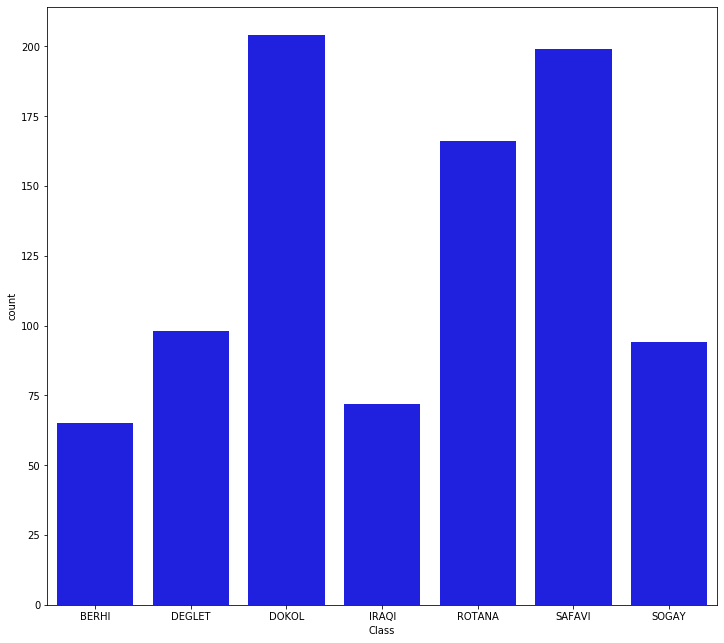

In [10]:
{
    "tags": [
        "remove-input"
    ]
}
sns.countplot(df['Class'], color='blue')

### 3. Modelling

The first step was of modelling dimension reudction. The number of features for this dataset were 35, which meant that they would have an impact on computation time when training the model. The first step was to remove the features that showed almost minimal variance to achieve this it was necessary to split the dataset into predictor and response variables and then removing features that had variance of less than of 0.1. 10 features were removed from the dataset and 24 features were reatined as predictor variables.

In [11]:
{
    "tags": [
        "remove-input"
    ]
}
X = df.drop(labels=['Class'], axis=1)
y = df['Class']

#### Excluding Features that have a variance of less than 0.1

In [12]:
{
    "tags": [
        "remove-input"
    ]
}


X = X.loc[:, X.std(axis=0) > 0.9]
X.shape

(898, 24)

#### Splitting to Train and Test Sets

When machine learning algorithms are used to generate predictions on data that was not used to train the model, the train-test split process is used to measure their performance. It is a quick and simple technique that allows you to compare the performance of machine learning algorithms for your predictive modeling challenge. Although the process is straightforward to use and comprehend, there are circumstances when it should not be utilized, such as when you have a tiny dataset or when further setup is necessary, such as when it is used for classification and the dataset is not balanced.

In [13]:
{
    "tags": [
        "remove-input"
    ]
}

X_train, X_test, y_train, y_test =train_test_split(X,y,test_size=0.3,random_state=42)

#### Setting Up Options and Metrics to Measure Model Perfomance

The perfomance metric used in this instance, was accuracy, that is how well the model can correctly classify dates into their correct classes. Seeding was used to ensure that the same results were obtained when the data was shuffled. Cross-validation was used to because it allows a model to train on numerous train-test splits. This provides you a better idea of how your model will perform on untested data. Hold-out, on the other hand, is reliant on a single train-test split.

In [14]:
{
    "tags": [
        "remove-input"
    ]
}

# Test options and evaluation metric
num_folds = 10
seed = 42
scoring = 'accuracy'

#### Spotchecking Algorithms

In [15]:
{
    "tags": [
        "remove-input"
    ]
}

# Spot-Check Algorithms
models = []
models.append(('LR', LogisticRegression()))
models.append(('CART', DecisionTreeClassifier()))


results = []
names = []
for name, model in models:
    kfold = KFold(n_splits=num_folds,shuffle=True, random_state=seed)
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

LR: 0.554096 (0.052471)
CART: 0.818459 (0.053752)


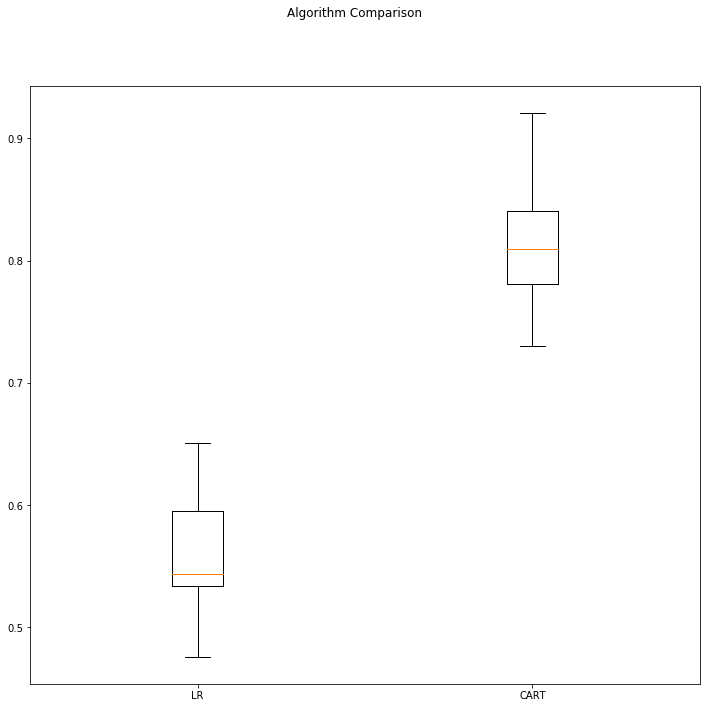

In [16]:
{
    "tags": [
        "remove-input"
    ]
}
# Compare Algorithms
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()


On traing the model, when the data was used directly, the Logistic Regression model had an accuaracy of 56% and the Decision Tree model had an accuracy of 81% . However, the data could be rescaled to ensure that they had a uniform scale. This process is called rescaling.
Data rescaling makes it easier for a model to learn and grasp the situation better because of a uniform scale applied to all features. When conducting machine learning algorithms on a data set, scaling falls under the category of data pre-processing.

#### Rescaling Data

In [17]:
{
    "tags": [
        "remove-input"
    ]
}

# Standardize the dataset
pipelines = []
pipelines.append(('ScaledLR', Pipeline([('Scaler', StandardScaler()),('LR',LogisticRegression())])))
pipelines.append(('ScaledCART', Pipeline([('Scaler', StandardScaler()),('CART',DecisionTreeClassifier())])))
results = []
names = []
for name, model in pipelines:
    kfold = KFold(n_splits=num_folds,shuffle  = True, random_state=seed)
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)


ScaledLR: 0.904327 (0.031514)
ScaledCART: 0.815259 (0.041645)


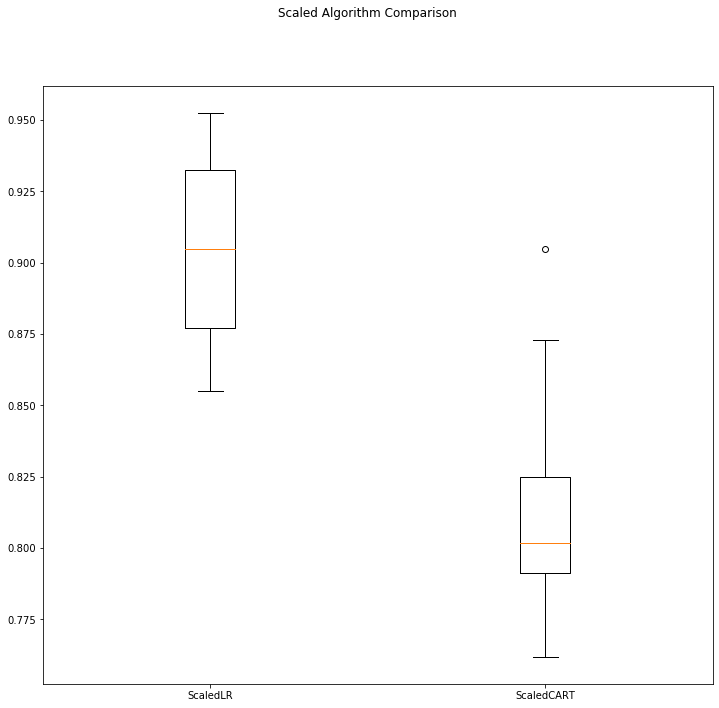

In [18]:
{
    "tags": [
        "remove-input"
    ]
}


# Compare Algorithms
fig = plt.figure()
fig.suptitle('Scaled Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()


On rescaling the predictors, and retraining the model, the performance of the Logistic regression model increased to 91%, and the performance of the decision tree model remained the same.

#### Fitting Both Models on the Testing Set and Checking the Perfomance

In [19]:
{
    "tags": [
        "remove-input"
    ]
}


# prepare the model
scaler = StandardScaler().fit(X_train)
rescaledX = scaler.transform(X_train)
model = LogisticRegression()
model.fit(rescaledX, y_train)
# estimate accuracy on validation dataset
rescaledValidationX = scaler.transform(X_test)
predictions = model.predict(rescaledValidationX)
print(accuracy_score(y_test, predictions))
print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))


0.9185185185185185
[[16  0  0  1  0  0  0]
 [ 0 19  3  0  2  0  4]
 [ 0  4 63  0  0  0  0]
 [ 2  0  0 19  0  0  0]
 [ 0  0  0  0 54  0  1]
 [ 1  0  0  0  0 50  0]
 [ 0  3  0  0  0  1 27]]
              precision    recall  f1-score   support

       BERHI       0.84      0.94      0.89        17
      DEGLET       0.73      0.68      0.70        28
       DOKOL       0.95      0.94      0.95        67
       IRAQI       0.95      0.90      0.93        21
      ROTANA       0.96      0.98      0.97        55
      SAFAVI       0.98      0.98      0.98        51
       SOGAY       0.84      0.87      0.86        31

    accuracy                           0.92       270
   macro avg       0.90      0.90      0.90       270
weighted avg       0.92      0.92      0.92       270



On evaluating the model, the logistic regression model maintained its perfomance, indicating that the model was a good fit.

In [20]:
{
    "tags": [
        "remove-input"
    ]
}

# prepare the model
scaler = StandardScaler().fit(X_train)
rescaledX = scaler.transform(X_train)
model = DecisionTreeClassifier()
model.fit(rescaledX, y_train)
# estimate accuracy on validation dataset
rescaledValidationX = scaler.transform(X_test)
predictions = model.predict(rescaledValidationX)
print(accuracy_score(y_test, predictions))
print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))

0.8444444444444444
[[12  0  0  5  0  0  0]
 [ 0 17  3  0  2  0  6]
 [ 0  2 65  0  0  0  0]
 [ 6  0  0 15  0  0  0]
 [ 1  2  0  2 49  0  1]
 [ 0  0  0  0  0 50  1]
 [ 4  7  0  0  0  0 20]]
              precision    recall  f1-score   support

       BERHI       0.52      0.71      0.60        17
      DEGLET       0.61      0.61      0.61        28
       DOKOL       0.96      0.97      0.96        67
       IRAQI       0.68      0.71      0.70        21
      ROTANA       0.96      0.89      0.92        55
      SAFAVI       1.00      0.98      0.99        51
       SOGAY       0.71      0.65      0.68        31

    accuracy                           0.84       270
   macro avg       0.78      0.79      0.78       270
weighted avg       0.85      0.84      0.85       270



The Decision Tree model increased its performance from 81% to 82%. The model was also a good fit.

## Conclusion
Exploratory data analysis is important in understanding the data you are working with. 
The models that were fit on the data were good fits on the dataset, indicated by their performance on the testing sets. 
Preprocessing tasks such as dealing with outliers, missing data, and rescaling are important and contribute a great deal to the performance on the model.

#### Recommendation
The models performance can be improved by finding efficient ways of dealing with the large number of outliers that were in the dataset.
The model may have also had the problem of multicollinearity, due to the high correlation among some features, which could have mislead the dataset.